In [86]:
import sys
sys.path.append("../../src/earthtext")

from osm import osm
import os
import geopandas as gpd
import pandas as pd
from progressbar import progressbar as pbar
import numpy as np
from pyproj import CRS
import shapely as sh
import geoplot as gplt
epsg4326 = CRS.from_epsg(4326)
epsg_california = CRS.from_epsg(26946)
import shapely
import matplotlib.pyplot as plt

In [2]:
from glob import glob

scenes_folder = "/opt/data/california-naip-defs"

In [19]:
files = list(glob(f'{scenes_folder}/**/*.parquet', recursive=True))
files = [f for f in files if not 'epsg' in f and not 'centroid' in f]
len(files)

1267

In [20]:
def read2epsgcalifornia(file_name):
    r = gpd.read_parquet(file_name) 
    r.crs = epsg4326
    r = r.to_crs(epsg_california)
    return r


# create dataframes with only the centroid as numerical (not shapely geometries)

In [158]:
# convert all files to epsg california in meters
badrows = []
for file in pbar(files):
    dest_fname = file[:-8]+"_epsg_california.parquet"
    r = read2epsgcalifornia(file)
    #r.to_parquet(dest_fname)

    rcoords = []
    for _,row in r.iterrows():
        try:
            g = row.geometry.centroid        
            rcoords.append([row.chipid, g.x, g.y, row.embeddings])
        except Exception as e:
            badrows.append(row.copy())
            asdad
    r = pd.DataFrame(rcoords, columns=['chipid', 'lonm', 'latm', 'embeddings'])
    dest_fname = file[:-8]+"_epsg_california_centroids.parquet"
    r.to_parquet(dest_fname)

100% (1267 of 1267) |####################| Elapsed Time: 0:05:11 Time:  0:05:110225


In [159]:
dest_fname

'/opt/data/california-naip-defs/ca_m_3511834_ne_11_060_20220607/index_ca_m_3511834_ne_11_060_20220607_epsg_california_centroids.parquet'

In [160]:
cfiles = list(glob(f'{scenes_folder}/**/*centroids.parquet', recursive=True))
len(cfiles)

1383

In [161]:
c = pd.concat([pd.read_parquet(cfile) for cfile in pbar(cfiles)])

100% (1383 of 1383) |####################| Elapsed Time: 0:00:34 Time:  0:00:340002
/tmp/ipykernel_14033/987450842.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  c = pd.concat([pd.read_parquet(cfile) for cfile in pbar(cfiles)])


In [162]:
c.shape

(2394599, 4)

In [163]:
c.head()

,chipid,lonm,latm,embeddings
0,ca_m_3311601_ne_11_060_20220506-0-0,1.936363e+06,703670.650521,"[-0.13589296, 0.01969828, 0.1377942, 0.0061442..."
1,ca_m_3311601_ne_11_060_20220506-1-0,1.936516e+06,703669.543583,"[-0.13061136, 0.023048798, 0.15017103, 0.01665..."
2,ca_m_3311601_ne_11_060_20220506-2-0,1.936670e+06,703668.436601,"[-0.12934385, 0.025013905, 0.13805251, 0.01208..."
3,ca_m_3311601_ne_11_060_20220506-3-0,1.936823e+06,703667.329576,"[-0.13369878, 0.022911016, 0.14487253, 0.01227..."
4,ca_m_3311601_ne_11_060_20220506-4-0,1.936977e+06,703666.222508,"[-0.1251994, 0.028975882, 0.14029442, 0.015018..."


In [164]:
z = gpd.read_parquet("/opt/data/california-naip-chips/california-naip-chips-100k.parquet")
z.crs = epsg4326
z = z.to_crs(epsg_california)

In [165]:
zcoords = np.r_[[list(k.centroid.coords)[0] for k in z.geometry.values]]

In [167]:
# coords for all chips
cc = np.r_[c[['lonm', 'latm']].values]


In [168]:
from joblib import Parallel, delayed


def getneighbours(zi):
    zdistances           = np.linalg.norm(cc - zi, axis=1)
    neighbours_idxs      = np.argwhere(zdistances<2000)[:,0]
    neighbours_distances = zdistances[zdistances<2000]
    return [neighbours_idxs, neighbours_distances]

In [107]:
zneighbours = Parallel(n_jobs=60, verbose=2)(delayed(getneighbours)(zi) for zi in zcoords)


[Parallel(n_jobs=60)]: Using backend LokyBackend with 60 concurrent workers.
[Parallel(n_jobs=60)]: Done  42 tasks      | elapsed:    3.5s
[Parallel(n_jobs=60)]: Done 370 tasks      | elapsed:    5.3s
[Parallel(n_jobs=60)]: Done 936 tasks      | elapsed:    7.6s
[Parallel(n_jobs=60)]: Done 1666 tasks      | elapsed:   10.3s
[Parallel(n_jobs=60)]: Done 2556 tasks      | elapsed:   13.6s
[Parallel(n_jobs=60)]: Done 3610 tasks      | elapsed:   17.5s
[Parallel(n_jobs=60)]: Done 4824 tasks      | elapsed:   21.9s
[Parallel(n_jobs=60)]: Done 6202 tasks      | elapsed:   27.0s
[Parallel(n_jobs=60)]: Done 7740 tasks      | elapsed:   32.7s
[Parallel(n_jobs=60)]: Done 9442 tasks      | elapsed:   38.9s
[Parallel(n_jobs=60)]: Done 11304 tasks      | elapsed:   45.7s
[Parallel(n_jobs=60)]: Done 13330 tasks      | elapsed:   53.2s
[Parallel(n_jobs=60)]: Done 15516 tasks      | elapsed:  1.0min
[Parallel(n_jobs=60)]: Done 17866 tasks      | elapsed:  1.2min
[Parallel(n_jobs=60)]: Done 20376 tasks 

In [ ]:
neighbours_folder = "/opt/data/california-naip-chips/california-naip-chips-100k-neighbours"

In [191]:
for i in pbar(range(10,len(zcoords))):
    fname = f"{neighbours_folder}/{z.iloc[i].original_chip_id}.parquet"
    if os.path.isfile(fname):
        continue
        
    check1 = np.allclose(np.r_[z.iloc[i].geometry.centroid.coords], zcoords[i])

    zi = zcoords[i]
    nidxs, ndist = zneighbours[i]

    nidxs = nidxs[ndist<2000]
    ndist = ndist[ndist<2000]

    cn = c.iloc[nidxs].copy()
    cn['distance'] = ndist

    check2 = np.allclose(cn[['lonm', 'latm']].values, cc[nidxs])
    if not check1 or not check2:
        raise ValueError("checks failed")

    fname = f"{neighbours_folder}/{z.iloc[i].original_chip_id}.parquet"
    cn.to_parquet(fname)
    

100% (104230 of 104230) |################| Elapsed Time: 1:22:11 Time:  1:22:114042


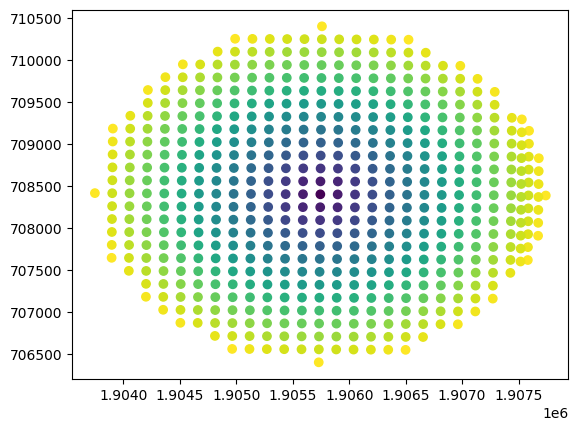

In [192]:
plt.scatter(cn.lonm.values, cn.latm.values, c=cn.distance/2000)

In [188]:
neighbours_folder = "/opt/data/california-naip-chips/california-naip-chips-100k-neighbours"
fname = f"{neighbours_folder}/{z.iloc[i].original_chip_id}.parquet"


In [189]:
fname = f"{neighbours_folder}/{z.iloc[i].original_chip_id}.parquet"
fname

'/opt/data/california-naip-chips/california-naip-chips-100k-neighbours/ca_m_3411730_sw_11_060_20220501-36-11.parquet'

In [ ]:
file_name

In [132]:
i = np.random.randint(len(zcoords))
zi = zcoords[i]
nidxs, ndist = zneighbours[i]

In [137]:
nidxs = nidxs[ndist<500]

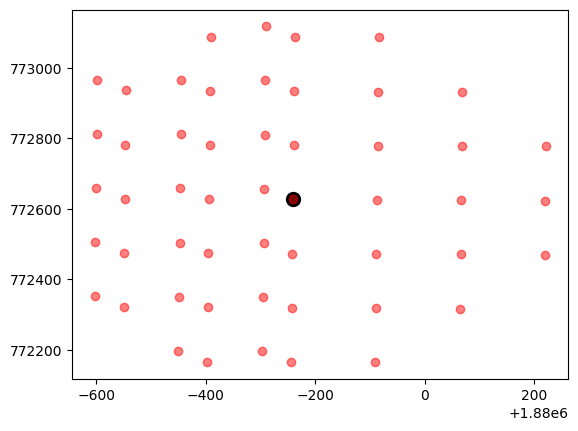

In [138]:
plt.scatter(*zi, s=100, color='black')
plt.scatter(cc[nidxs][:,0], cc[nidxs][:,1], color='red', alpha=.5)

In [148]:
np.allclose(np.r_[z.iloc[i].geometry.centroid.coords], zcoords[i])

True

In [151]:
np.allclose(c.iloc[nidxs][['lonm', 'latm']].values, cc[nidxs])

True

In [140]:
cc[nidxs][:10]

array([[1879709.88240383,  773117.32457399],
       [1879401.43624392,  772965.79481303],
       [1879555.12060313,  772964.71751244],
       [1879708.80499227,  772963.64012792],
       [1879400.35897028,  772812.11051075],
       [1879554.04324561,  772811.03318018],
       [1879707.72755088,  772809.95576578],
       [1879399.28166662,  772658.42629229],
       [1879552.96585816,  772657.34893175],
       [1879706.65007964,  772656.27148747]])

In [155]:
c.iloc[nidxs]

,chipid,lonm,latm
159,ca_m_3411728_nw_11_060_20220507-39-3,1.879710e+06,773117.324574
197,ca_m_3411728_nw_11_060_20220507-37-4,1.879401e+06,772965.794813
198,ca_m_3411728_nw_11_060_20220507-38-4,1.879555e+06,772964.717512
199,ca_m_3411728_nw_11_060_20220507-39-4,1.879709e+06,772963.640128
237,ca_m_3411728_nw_11_060_20220507-37-5,1.879400e+06,772812.110511
238,ca_m_3411728_nw_11_060_20220507-38-5,1.879554e+06,772811.033180
239,ca_m_3411728_nw_11_060_20220507-39-5,1.879708e+06,772809.955766
277,ca_m_3411728_nw_11_060_20220507-37-6,1.879399e+06,772658.426292
278,ca_m_3411728_nw_11_060_20220507-38-6,1.879553e+06,772657.348932
279,ca_m_3411728_nw_11_060_20220507-39-6,1.879707e+06,772656.271487


In [73]:
neighbours_idxs      = np.argwhere(zdistances<2000)[:,0]
neighbours_distances = zdistances[zdistances<2000]

In [267]:
rcoords = []
for _,row in pbar(r.iterrows()):
    g = row.geometry.centroid
    rcoords.append([row.chipid, g.x, g.y])
pd.DataFrame(rcoords, columns=['chipid', 'lonm', 'latm'])

| | #                                              | 1919 Elapsed Time: 0:00:00


,chipid,lonm,latm
0,ca_m_3511834_ne_11_060_20220607-0-0,1.767121e+06,872764.876502
1,ca_m_3511834_ne_11_060_20220607-1-0,1.767274e+06,872763.923337
2,ca_m_3511834_ne_11_060_20220607-2-0,1.767428e+06,872762.970030
3,ca_m_3511834_ne_11_060_20220607-3-0,1.767582e+06,872762.016580
4,ca_m_3511834_ne_11_060_20220607-4-0,1.767736e+06,872761.062988
...,...,...,...
1915,ca_m_3511834_ne_11_060_20220607-35-47,1.772456e+06,865507.035382
1916,ca_m_3511834_ne_11_060_20220607-36-47,1.772609e+06,865506.072805
1917,ca_m_3511834_ne_11_060_20220607-37-47,1.772763e+06,865505.110089
1918,ca_m_3511834_ne_11_060_20220607-38-47,1.772917e+06,865504.147236


In [263]:
row

chipid                                  ca_m_3511834_ne_11_060_20220607-0-0
date                                                             2022-06-07
chip_index_x                                                              0
chip_index_y                                                              0
cloud_cover_percentage                                                  0.0
nodata_percentage                                                       0.0
geometry                  POLYGON ((1767198.0986051848 872841.2552177046...
embeddings                [-0.14834243, 0.017225852, 0.14572574, 0.00996...
Name: 0, dtype: object

In [214]:
files = list(glob(f'{scenes_folder}/**/*_epsg_california.parquet', recursive=True))
len(files)

1267

In [221]:
zgeoms = {i: [files[i], sh.geometry.GeometryCollection(gpd.read_parquet(files[i]).geometry.values).convex_hull] for i in pbar(range(len(files)))}
zgeoms = gpd.GeoDataFrame(pd.DataFrame(zgeoms, index=['file', 'geometry']).T, crs=epsg_california)


100% (1267 of 1267) |####################| Elapsed Time: 0:00:36 Time:  0:00:360003


In [222]:
zgeoms.crs

<Projected CRS: EPSG:26946>
Name: NAD83 / California zone 6
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - California - counties Imperial; Orange; Riverside; San Diego.
- bounds: (-118.15, 32.53, -114.42, 34.08)
Coordinate Operation:
- name: SPCS83 California zone 6 (meters)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [223]:
zgeoms.explore()

# expand to get the neighbours of each scene

In [224]:
zegeoms = zgeoms.copy()
zegeoms['geometry'] = [shapely.affinity.scale(gi, xfact=1.2, yfact=1.2) for gi in zgeoms.geometry]
zegeoms.explore()

In [225]:
# get the neighboring scenes for each scene
intersecting = [[i for i in range(len(zegeoms)) if zegeoms.geometry.values[i].intersects(gi)] for gi in pbar(zegeoms.geometry.values)]

100% (1267 of 1267) |####################| Elapsed Time: 0:00:23 Time:  0:00:230001


In [226]:
zgeoms.geometry.values[0].centroid.x


1939333.4149370005

In [244]:
# for each scene get its neighbours
for i in range(len(zgeoms)):
    zneigh = zgeoms.iloc[intersecting[i]]
    zneigh = pd.concat([gpd.read_parquet(f) for f in zneigh.file])
    break
intersecting[i]

[0, 1, 2, 3, 5, 7, 276, 278, 280]

In [255]:
zgeoms.iloc[intersecting[i]].explore()

In [254]:
1

1

In [248]:
neighborhood_size_meters = 500

In [253]:
zchips = gpd.read_parquet(zgeoms.file.values[i])
zneigh_geoms = zneigh.geometry.values
for chip in pbar(zchips.geometry.values):
    # redius around chip
    echip = chip.centroid.buffer(neighborhood_size_meters)

    # chips intersecting that radius
    #nchip = zneigh[[echip.intersects(gi) for gi in zneigh_geoms]]
    nchip = zneigh[[echip.contains(gi) for gi in zneigh_geoms]]
        


  4% (88 of 1880) |#                     | Elapsed Time: 0:00:13 ETA:   0:04:35

KeyboardInterrupt: 

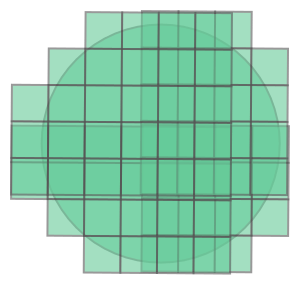

In [250]:
shapely.geometry.GeometryCollection([echip, chip] + list(nchip.geometry.values))